# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:10<00:00, 5.72KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

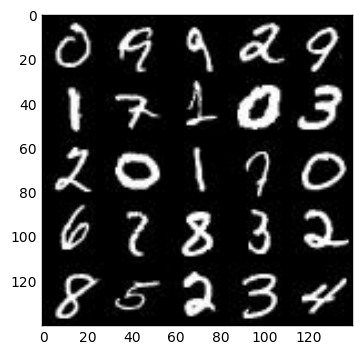

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

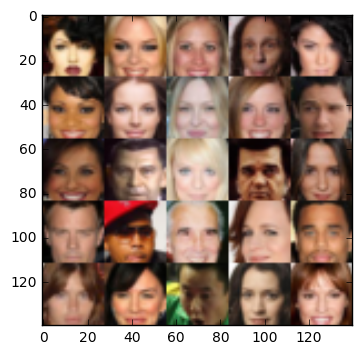

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, shape=[None, image_width, image_height, image_channels], name='input_real')
    inputs_z = tf.placeholder(tf.float32, shape=[None, z_dim], name='input_z')
    learningrate = tf.placeholder(tf.float32, name='learningrate')
    return inputs_real, inputs_z, learningrate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/carnd/anaconda3/lib/python3.5/runpy.py", line 184, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/carnd/anaconda3/lib/python3.5/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>\n    app.launch_new_instance()', 'File "/home/carnd/anaconda3/lib/python3.5/site-packages/traitlets/config/application.py", line 653, in launch_instance\n    app.start()', 'File "/home/carnd/anaconda3/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 474, in start\n    ioloop.IOLoop.instance().start()', 'File "/home/carnd/anaconda3/lib/python3.5/site-packages/zmq/eventloop/ioloop

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    keep_prob = 0.5
    alpha = 0.2
    xavier = tf.contrib.layers.xavier_initializer()
    with tf.variable_scope('discriminator', reuse=reuse):        
        x_1 = tf.layers.conv2d(images, 32, 4, strides=2, padding='same', kernel_initializer=xavier)
        x_1 = tf.layers.dropout(x_1, rate=(keep_prob), training=True)
        relu1 = tf.maximum(alpha * x_1, x_1)
        x_2 = tf.layers.conv2d(relu1, 64, 4, strides=2, padding='same', kernel_initializer=xavier)
        x_2 = tf.layers.dropout(x_2, rate=(keep_prob), training=True)
        bn_2 = tf.layers.batch_normalization(x_2, training=True)
        relu_2 = tf.maximum(alpha * bn_2, bn_2)
        x_3 = tf.layers.conv2d(relu_2, 128, 4, strides=2, padding='same', kernel_initializer=xavier)
        x_3 = tf.layers.dropout(x_3, rate=(keep_prob), training=True)
        bn_3 = tf.layers.batch_normalization(x_3, training=True)
        relu_3 = tf.maximum(alpha * bn_3, bn_3)
        flat = tf.reshape(relu_3, (-1, 4*4*128))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    reuse = not is_train
    keep_prob = 0.5
    alpha = 0.2
    xav = tf.contrib.layers.xavier_initializer()

    
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*256)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # print(x1.shape)
        # 4x4x256 now
        #change from 5 to 4 below
        x2 = tf.layers.conv2d_transpose(x1, 128, 4, strides=1, padding='valid', kernel_initializer=xav)
        x2 = tf.layers.dropout(x2, rate=(keep_prob), training=is_train)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # print(x2.shape)
        # 7x7x128 now
        
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same', kernel_initializer=xav)
        x3 = tf.layers.dropout(x3, rate=(keep_prob), training=is_train)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # print(x3.shape)
        # 14x14x64 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same', kernel_initializer=xav)
        # print(logits.shape)
        # 28x28x5 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    smooth = 0.1

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real) * (1 - smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    input_real, input_z, learningrate = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learningrate, beta1)
    
    steps = 0
    show_every=100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                
                # Convert 0.5 to 1
                batch_images *= 2
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, learningrate: learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images, learningrate: learning_rate})

                if steps % show_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)


### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2 Step 100... Discriminator Loss: 1.3966... Generator Loss: 1.2941


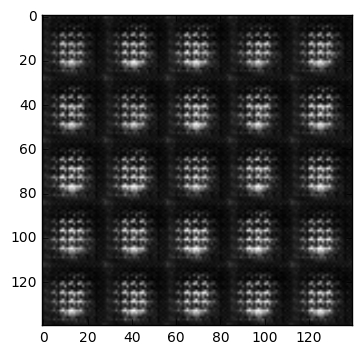

Epoch 1/2 Step 200... Discriminator Loss: 1.1646... Generator Loss: 1.7214


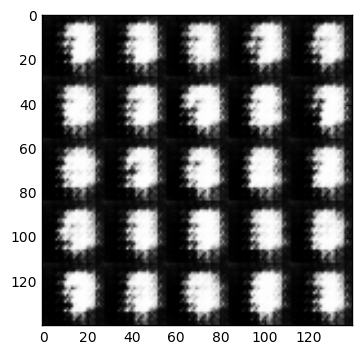

Epoch 1/2 Step 300... Discriminator Loss: 1.2586... Generator Loss: 1.5461


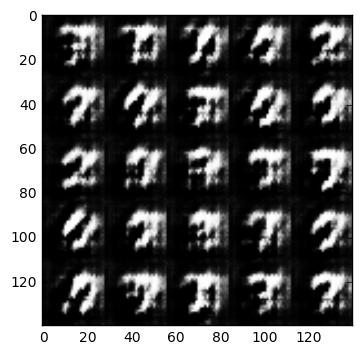

Epoch 1/2 Step 400... Discriminator Loss: 1.3439... Generator Loss: 1.1361


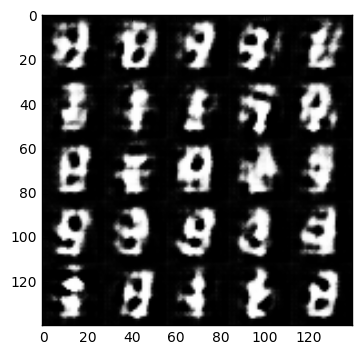

Epoch 1/2 Step 500... Discriminator Loss: 1.4479... Generator Loss: 1.0810


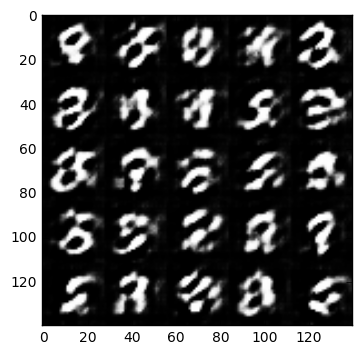

Epoch 1/2 Step 600... Discriminator Loss: 1.3356... Generator Loss: 0.8623


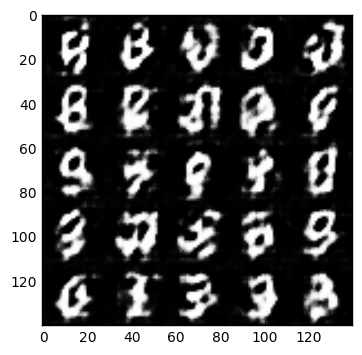

Epoch 1/2 Step 700... Discriminator Loss: 1.3534... Generator Loss: 1.1586


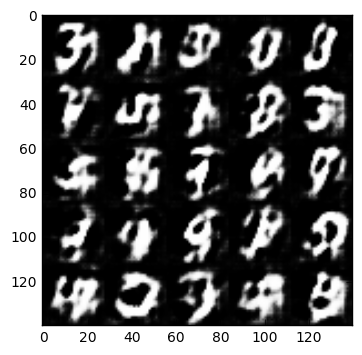

Epoch 1/2 Step 800... Discriminator Loss: 1.2274... Generator Loss: 1.0246


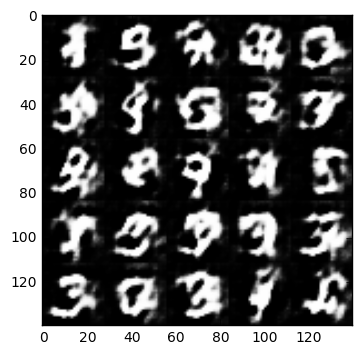

Epoch 1/2 Step 900... Discriminator Loss: 1.0839... Generator Loss: 0.9973


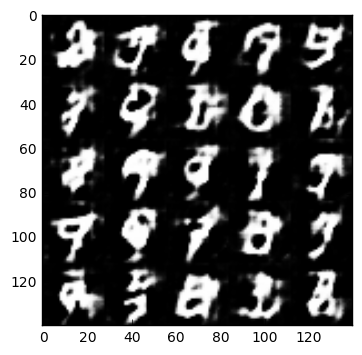

Epoch 1/2 Step 1000... Discriminator Loss: 1.1671... Generator Loss: 1.0727


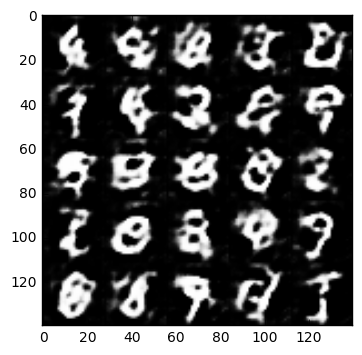

Epoch 1/2 Step 1100... Discriminator Loss: 1.0002... Generator Loss: 1.1569


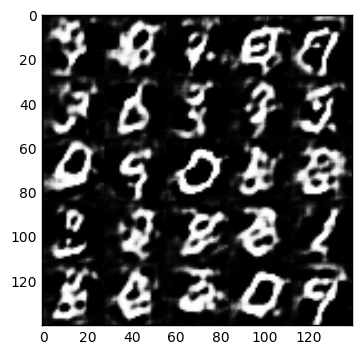

Epoch 1/2 Step 1200... Discriminator Loss: 1.1240... Generator Loss: 1.4787


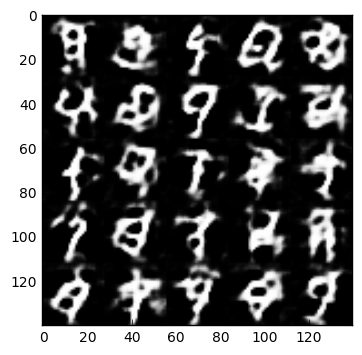

Epoch 1/2 Step 1300... Discriminator Loss: 1.2826... Generator Loss: 0.7799


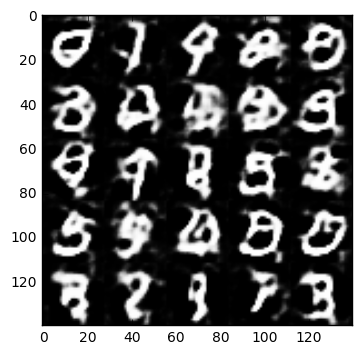

Epoch 1/2 Step 1400... Discriminator Loss: 1.2172... Generator Loss: 1.2933


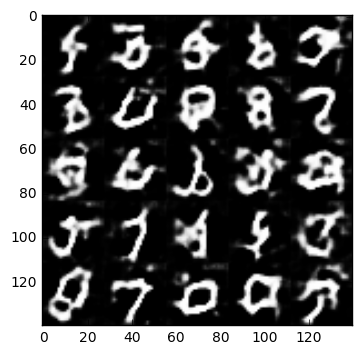

Epoch 1/2 Step 1500... Discriminator Loss: 1.2767... Generator Loss: 1.2359


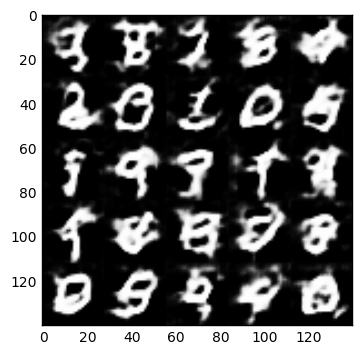

Epoch 1/2 Step 1600... Discriminator Loss: 1.0844... Generator Loss: 0.9934


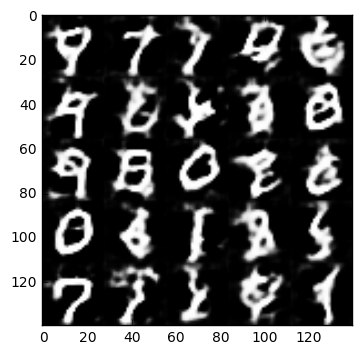

Epoch 1/2 Step 1700... Discriminator Loss: 1.4516... Generator Loss: 1.3361


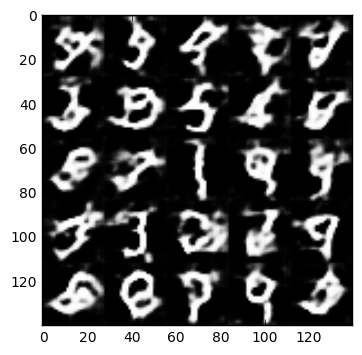

Epoch 1/2 Step 1800... Discriminator Loss: 1.3043... Generator Loss: 1.0931


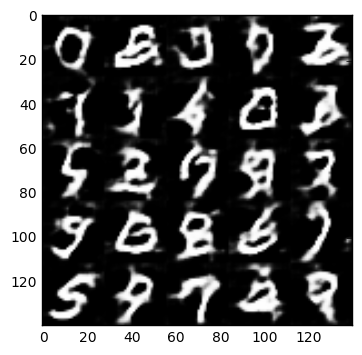

Epoch 2/2 Step 1900... Discriminator Loss: 1.2766... Generator Loss: 0.9580


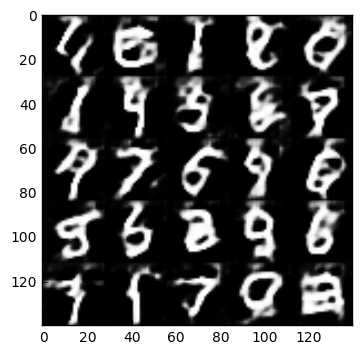

Epoch 2/2 Step 2000... Discriminator Loss: 1.0468... Generator Loss: 1.1462


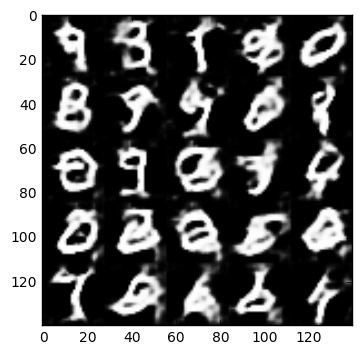

Epoch 2/2 Step 2100... Discriminator Loss: 1.0666... Generator Loss: 0.9061


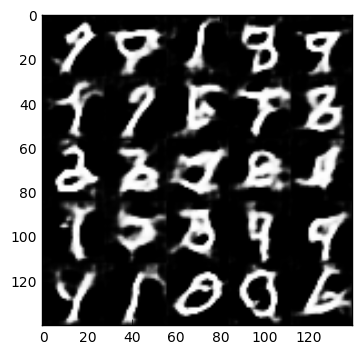

Epoch 2/2 Step 2200... Discriminator Loss: 1.1606... Generator Loss: 1.1402


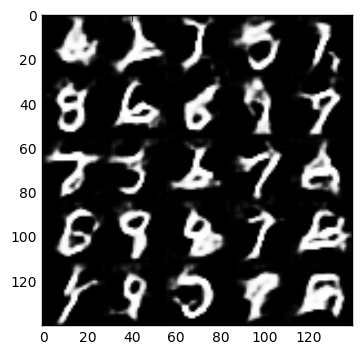

Epoch 2/2 Step 2300... Discriminator Loss: 1.1707... Generator Loss: 1.1966


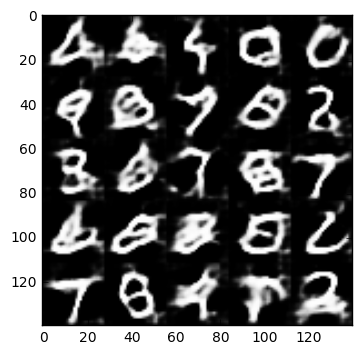

Epoch 2/2 Step 2400... Discriminator Loss: 1.1609... Generator Loss: 0.8965


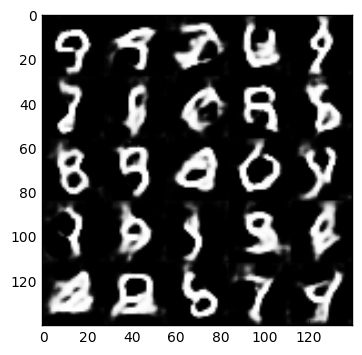

Epoch 2/2 Step 2500... Discriminator Loss: 0.9844... Generator Loss: 1.2375


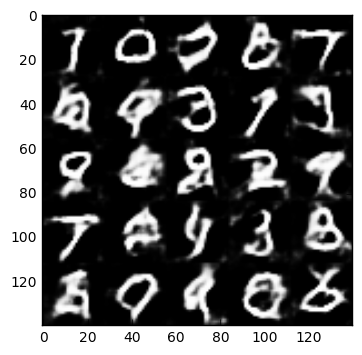

Epoch 2/2 Step 2600... Discriminator Loss: 1.0856... Generator Loss: 1.4884


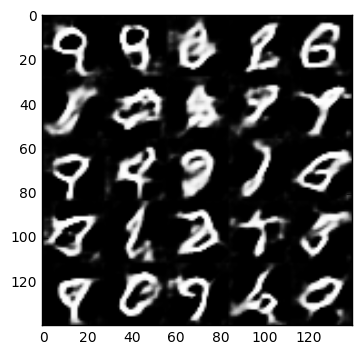

Epoch 2/2 Step 2700... Discriminator Loss: 1.0032... Generator Loss: 1.2843


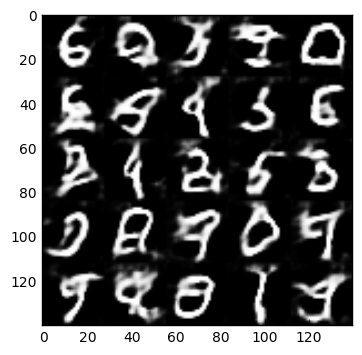

Epoch 2/2 Step 2800... Discriminator Loss: 1.0555... Generator Loss: 1.0255


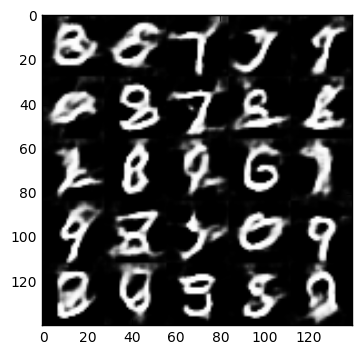

Epoch 2/2 Step 2900... Discriminator Loss: 1.2847... Generator Loss: 1.0523


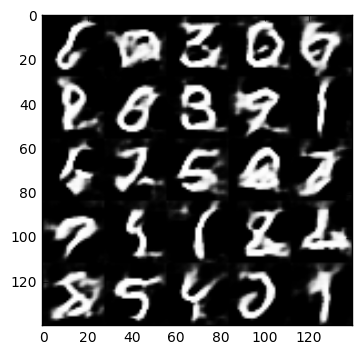

Epoch 2/2 Step 3000... Discriminator Loss: 1.1313... Generator Loss: 0.9211


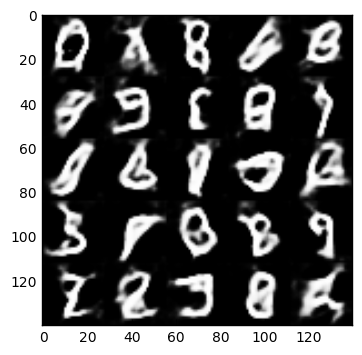

Epoch 2/2 Step 3100... Discriminator Loss: 1.1193... Generator Loss: 1.3289


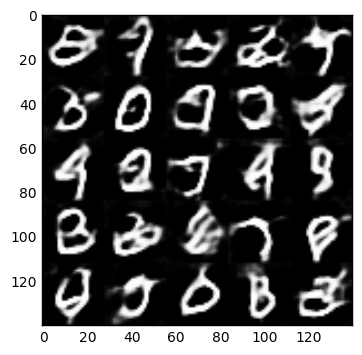

Epoch 2/2 Step 3200... Discriminator Loss: 1.5132... Generator Loss: 0.5280


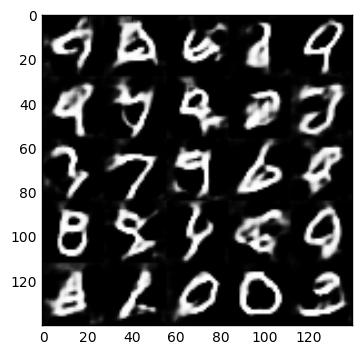

Epoch 2/2 Step 3300... Discriminator Loss: 1.2186... Generator Loss: 0.6752


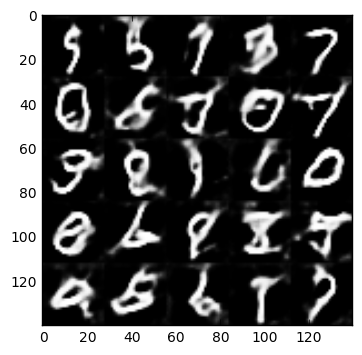

Epoch 2/2 Step 3400... Discriminator Loss: 0.9629... Generator Loss: 1.5849


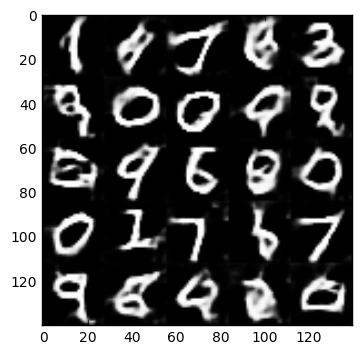

Epoch 2/2 Step 3500... Discriminator Loss: 1.2639... Generator Loss: 1.1552


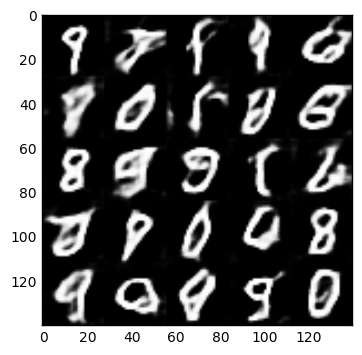

Epoch 2/2 Step 3600... Discriminator Loss: 1.0981... Generator Loss: 1.6707


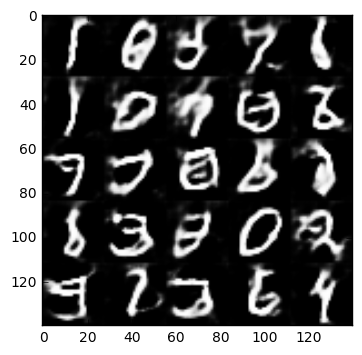

Epoch 2/2 Step 3700... Discriminator Loss: 0.9863... Generator Loss: 0.8775


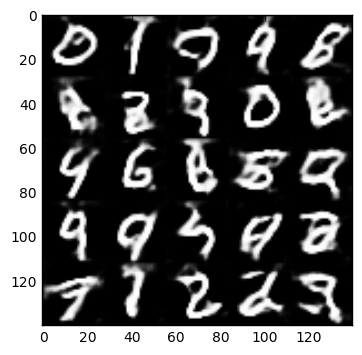

In [13]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1 Step 100... Discriminator Loss: 0.8043... Generator Loss: 1.6180


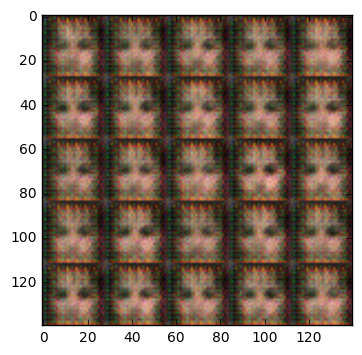

Epoch 1/1 Step 200... Discriminator Loss: 0.9617... Generator Loss: 1.5213


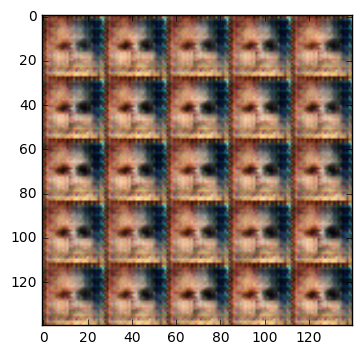

Epoch 1/1 Step 300... Discriminator Loss: 1.1200... Generator Loss: 1.2592


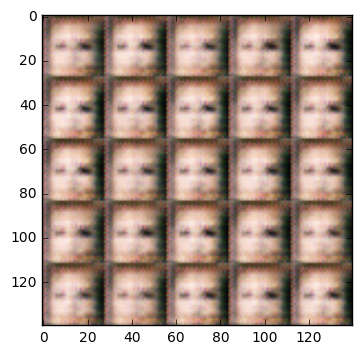

Epoch 1/1 Step 400... Discriminator Loss: 1.0428... Generator Loss: 1.9936


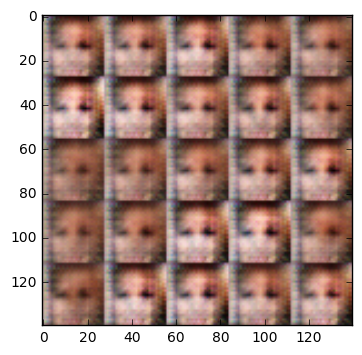

Epoch 1/1 Step 500... Discriminator Loss: 0.6517... Generator Loss: 2.8369


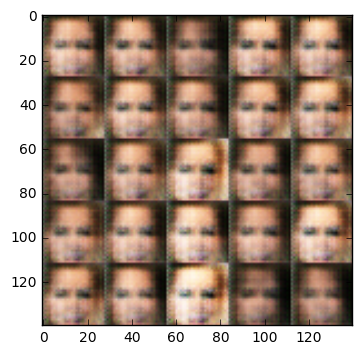

Epoch 1/1 Step 600... Discriminator Loss: 1.5210... Generator Loss: 1.1542


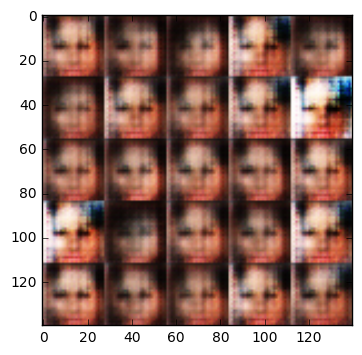

Epoch 1/1 Step 700... Discriminator Loss: 0.9341... Generator Loss: 1.4972


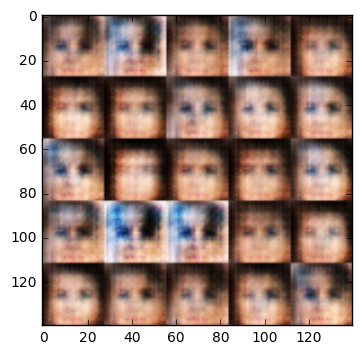

Epoch 1/1 Step 800... Discriminator Loss: 1.0159... Generator Loss: 1.3248


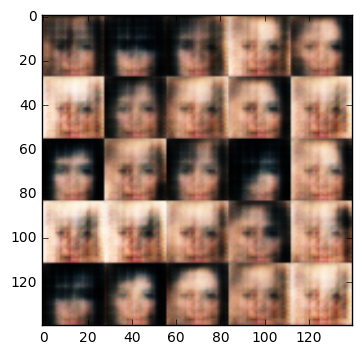

Epoch 1/1 Step 900... Discriminator Loss: 1.1987... Generator Loss: 1.2141


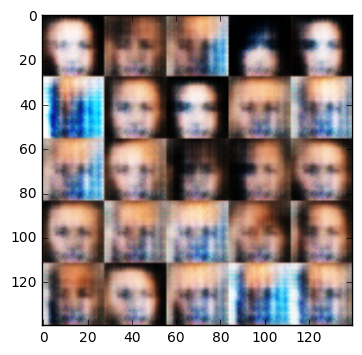

Epoch 1/1 Step 1000... Discriminator Loss: 1.1347... Generator Loss: 1.1500


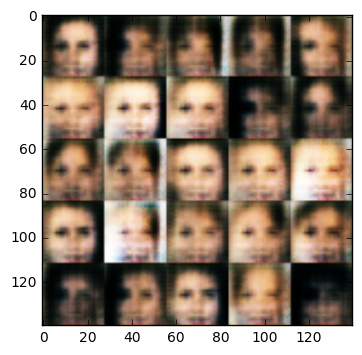

Epoch 1/1 Step 1100... Discriminator Loss: 1.3483... Generator Loss: 0.6336


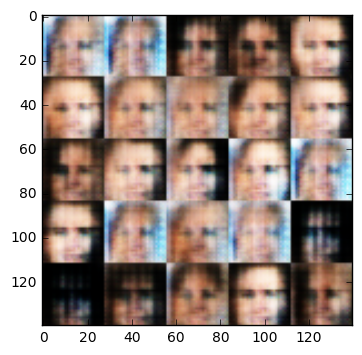

Epoch 1/1 Step 1200... Discriminator Loss: 1.1197... Generator Loss: 1.2007


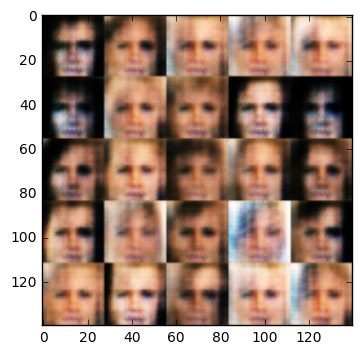

Epoch 1/1 Step 1300... Discriminator Loss: 1.0058... Generator Loss: 1.1803


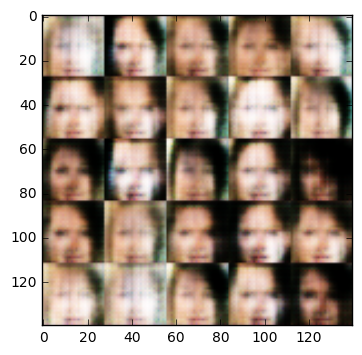

Epoch 1/1 Step 1400... Discriminator Loss: 0.9083... Generator Loss: 1.4627


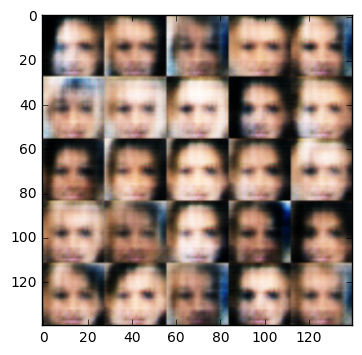

Epoch 1/1 Step 1500... Discriminator Loss: 1.4358... Generator Loss: 1.0015


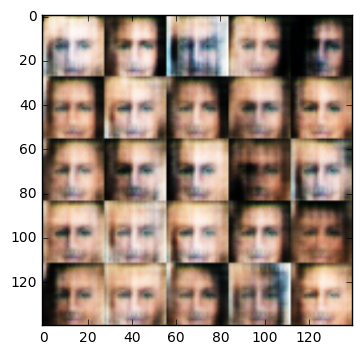

Epoch 1/1 Step 1600... Discriminator Loss: 1.2918... Generator Loss: 0.9373


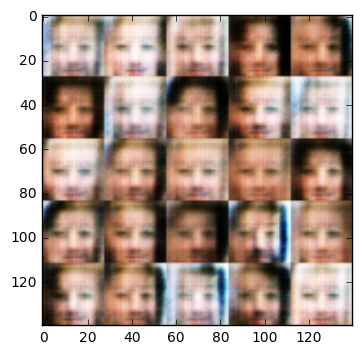

Epoch 1/1 Step 1700... Discriminator Loss: 1.3445... Generator Loss: 0.8997


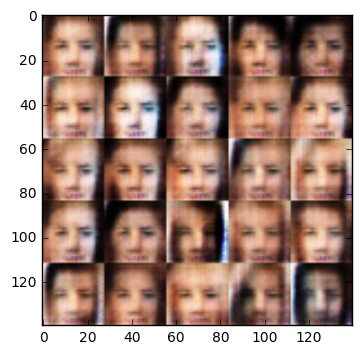

Epoch 1/1 Step 1800... Discriminator Loss: 1.1966... Generator Loss: 1.2435


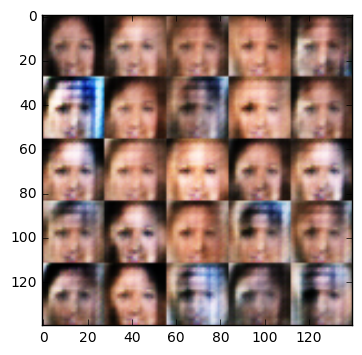

Epoch 1/1 Step 1900... Discriminator Loss: 1.1648... Generator Loss: 1.0330


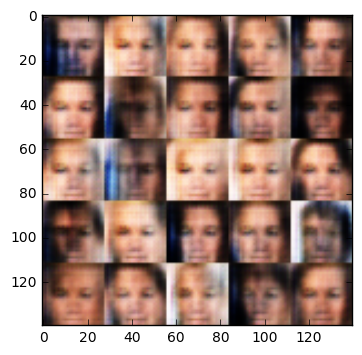

Epoch 1/1 Step 2000... Discriminator Loss: 1.3177... Generator Loss: 1.0835


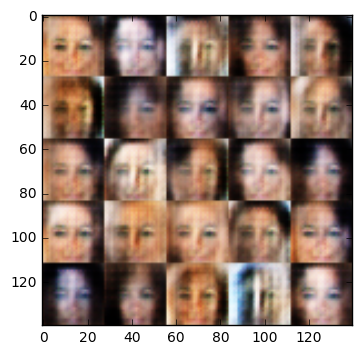

Epoch 1/1 Step 2100... Discriminator Loss: 1.0204... Generator Loss: 1.3843


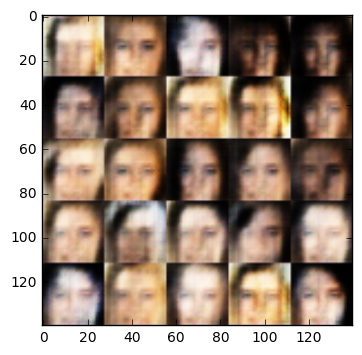

Epoch 1/1 Step 2200... Discriminator Loss: 1.2538... Generator Loss: 0.9962


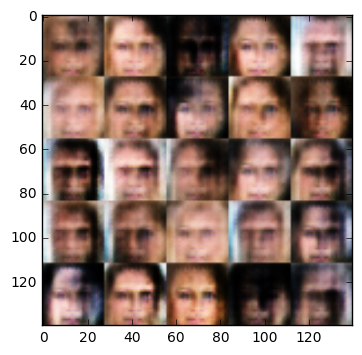

Epoch 1/1 Step 2300... Discriminator Loss: 1.2135... Generator Loss: 0.9042


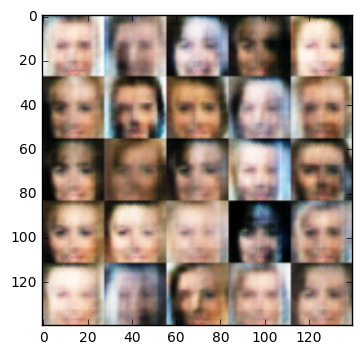

Epoch 1/1 Step 2400... Discriminator Loss: 1.2416... Generator Loss: 0.8424


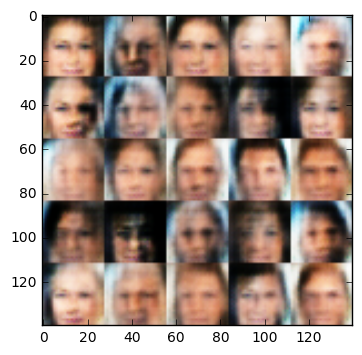

Epoch 1/1 Step 2500... Discriminator Loss: 1.1849... Generator Loss: 0.9661


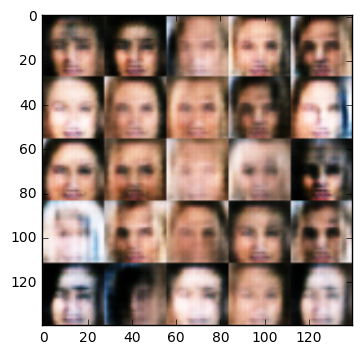

Epoch 1/1 Step 2600... Discriminator Loss: 1.2821... Generator Loss: 1.1616


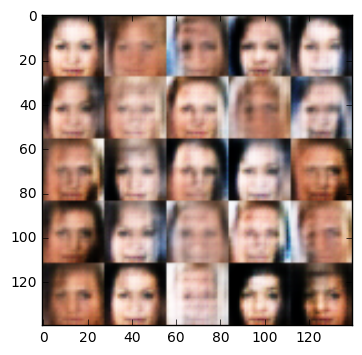

Epoch 1/1 Step 2700... Discriminator Loss: 1.1341... Generator Loss: 1.1483


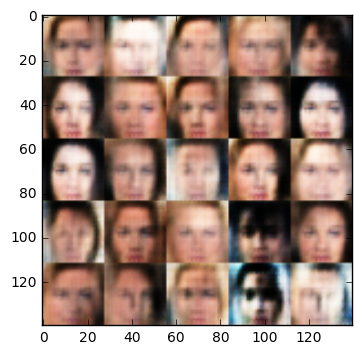

Epoch 1/1 Step 2800... Discriminator Loss: 1.2374... Generator Loss: 1.0336


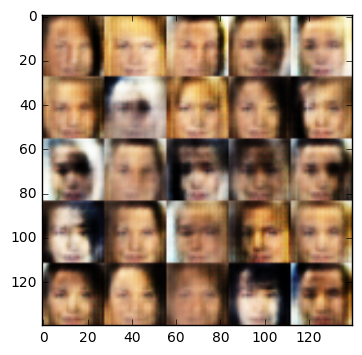

Epoch 1/1 Step 2900... Discriminator Loss: 1.4152... Generator Loss: 1.0428


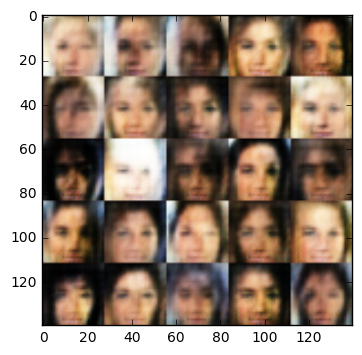

Epoch 1/1 Step 3000... Discriminator Loss: 1.2478... Generator Loss: 1.0052


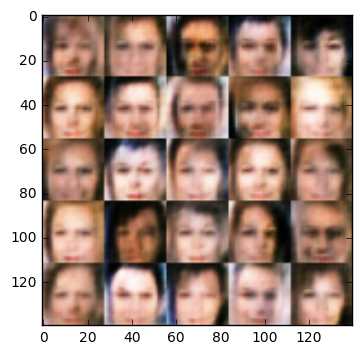

Epoch 1/1 Step 3100... Discriminator Loss: 1.3965... Generator Loss: 1.0092


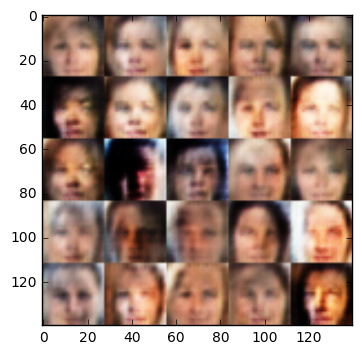

Epoch 1/1 Step 3200... Discriminator Loss: 1.3841... Generator Loss: 0.7379


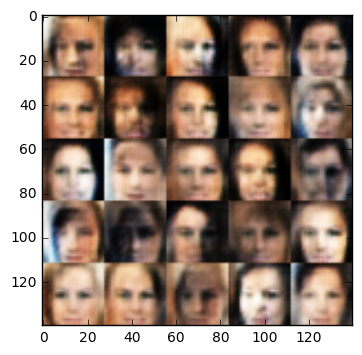

Epoch 1/1 Step 3300... Discriminator Loss: 1.0487... Generator Loss: 0.9199


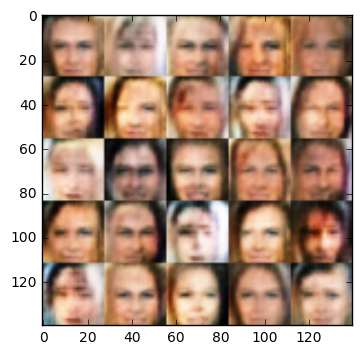

Epoch 1/1 Step 3400... Discriminator Loss: 1.3537... Generator Loss: 0.9831


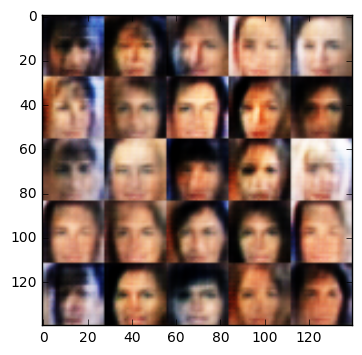

Epoch 1/1 Step 3500... Discriminator Loss: 1.3034... Generator Loss: 0.8040


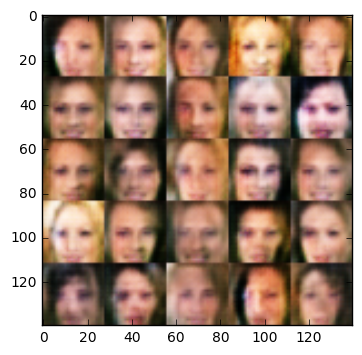

Epoch 1/1 Step 3600... Discriminator Loss: 1.3036... Generator Loss: 0.8915


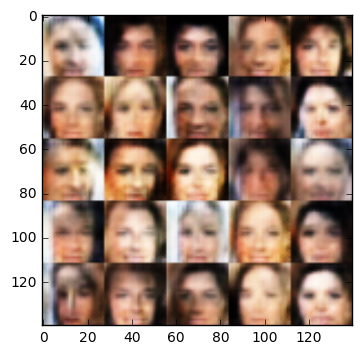

Epoch 1/1 Step 3700... Discriminator Loss: 1.1410... Generator Loss: 1.0968


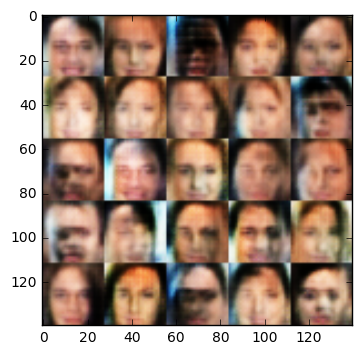

Epoch 1/1 Step 3800... Discriminator Loss: 1.1412... Generator Loss: 1.2521


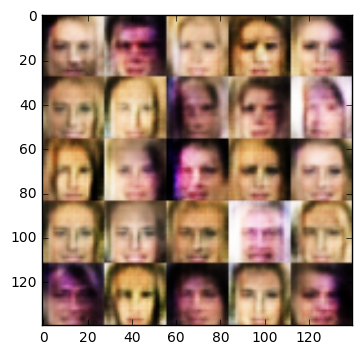

Epoch 1/1 Step 3900... Discriminator Loss: 1.2677... Generator Loss: 0.8743


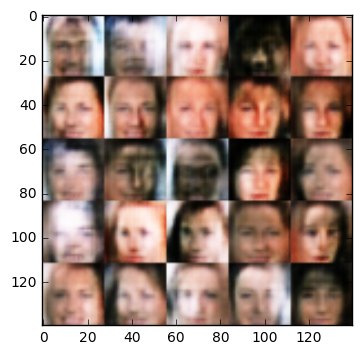

Epoch 1/1 Step 4000... Discriminator Loss: 1.2641... Generator Loss: 0.9670


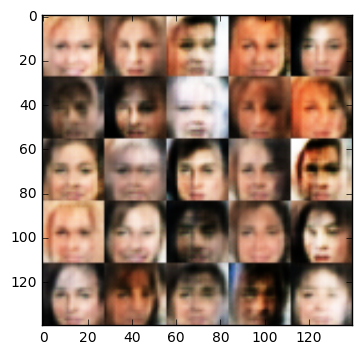

Epoch 1/1 Step 4100... Discriminator Loss: 1.2112... Generator Loss: 1.1508


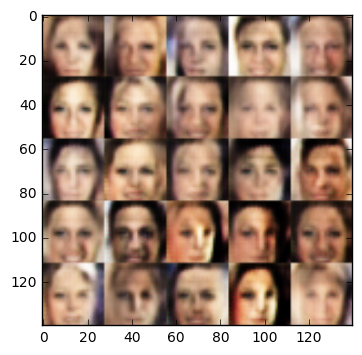

Epoch 1/1 Step 4200... Discriminator Loss: 1.3160... Generator Loss: 1.1517


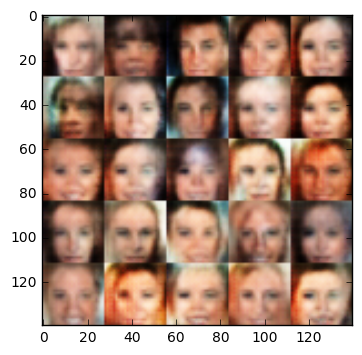

Epoch 1/1 Step 4300... Discriminator Loss: 1.2339... Generator Loss: 0.9373


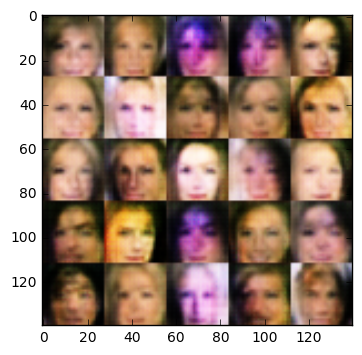

Epoch 1/1 Step 4400... Discriminator Loss: 1.2251... Generator Loss: 1.1490


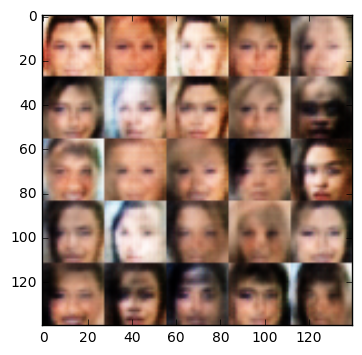

Epoch 1/1 Step 4500... Discriminator Loss: 1.2138... Generator Loss: 0.9329


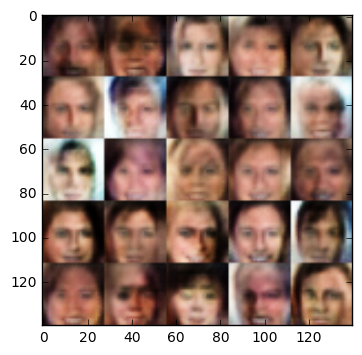

Epoch 1/1 Step 4600... Discriminator Loss: 1.2908... Generator Loss: 1.1882


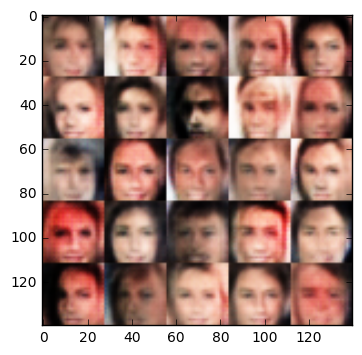

Epoch 1/1 Step 4700... Discriminator Loss: 1.1849... Generator Loss: 1.1288


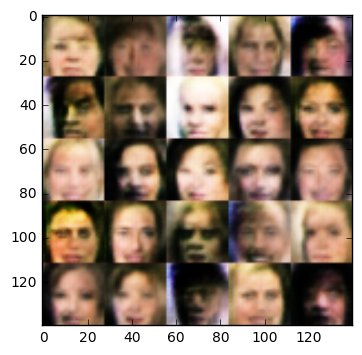

Epoch 1/1 Step 4800... Discriminator Loss: 1.0342... Generator Loss: 1.1248


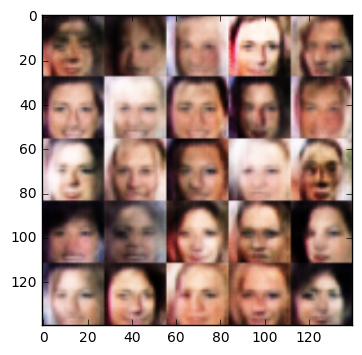

Epoch 1/1 Step 4900... Discriminator Loss: 1.4190... Generator Loss: 0.8246


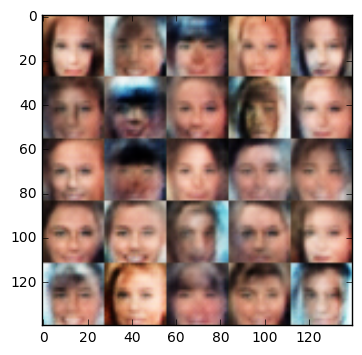

Epoch 1/1 Step 5000... Discriminator Loss: 1.3613... Generator Loss: 0.8371


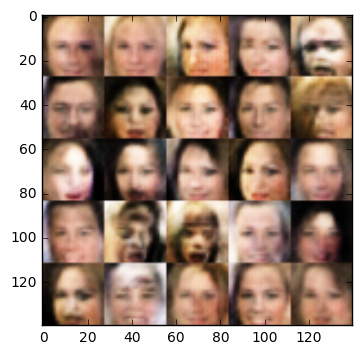

Epoch 1/1 Step 5100... Discriminator Loss: 0.9554... Generator Loss: 1.2719


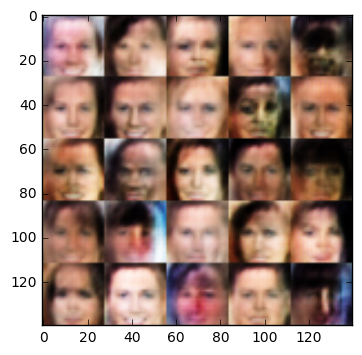

Epoch 1/1 Step 5200... Discriminator Loss: 1.2487... Generator Loss: 0.9509


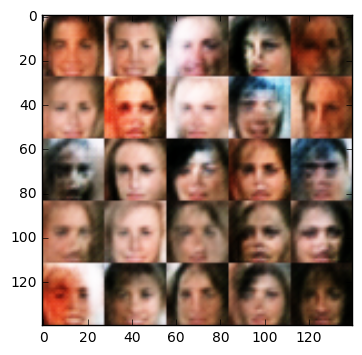

Epoch 1/1 Step 5300... Discriminator Loss: 1.2378... Generator Loss: 1.0070


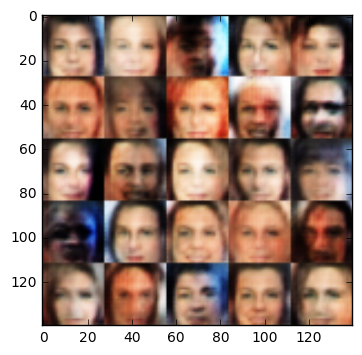

Epoch 1/1 Step 5400... Discriminator Loss: 1.4802... Generator Loss: 0.9093


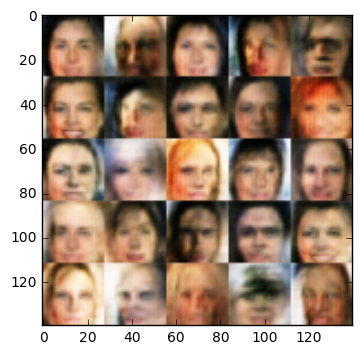

Epoch 1/1 Step 5500... Discriminator Loss: 1.2196... Generator Loss: 0.9274


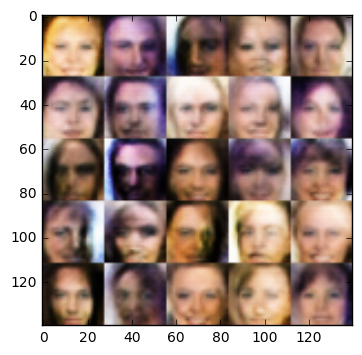

Epoch 1/1 Step 5600... Discriminator Loss: 1.2601... Generator Loss: 0.9022


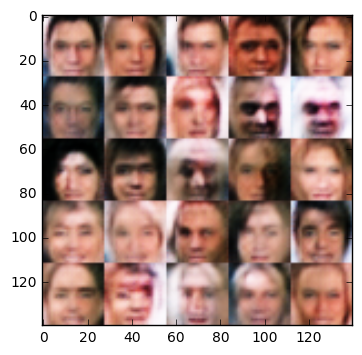

Epoch 1/1 Step 5700... Discriminator Loss: 1.1007... Generator Loss: 1.3560


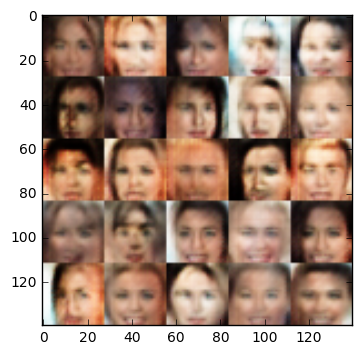

Epoch 1/1 Step 5800... Discriminator Loss: 1.2842... Generator Loss: 0.9300


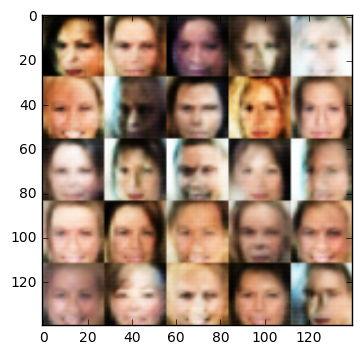

Epoch 1/1 Step 5900... Discriminator Loss: 1.1697... Generator Loss: 0.8103


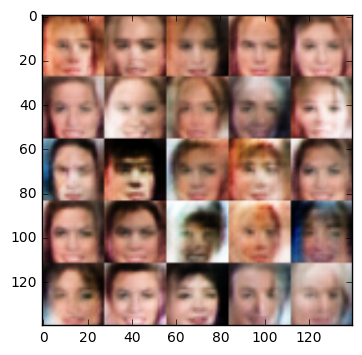

Epoch 1/1 Step 6000... Discriminator Loss: 1.2752... Generator Loss: 0.8669


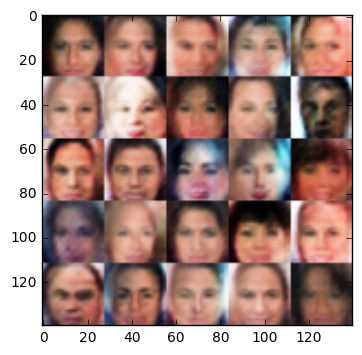

Epoch 1/1 Step 6100... Discriminator Loss: 1.2012... Generator Loss: 1.3542


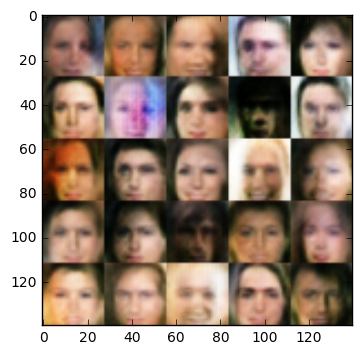

Epoch 1/1 Step 6200... Discriminator Loss: 1.2881... Generator Loss: 0.9753


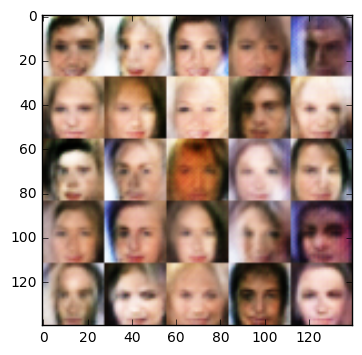

Epoch 1/1 Step 6300... Discriminator Loss: 1.1656... Generator Loss: 1.1444


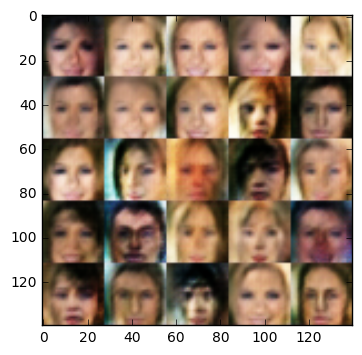

In [14]:
batch_size = 32
z_dim = 100
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.